In [20]:
#first, in order to test out partial dependence, we need to read in the data and create a model.
#here, we read in the data and do the usual pre-processing: imputing with a for loop, dropping NaS and creating
#one-hot features for our categorical features.
import pandas as pd

data = pd.read_csv('train.csv')

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import Imputer

for col in data.columns:
    if data[col].isnull().any()==True and (data[col].dtype=='float64'):
        median = data[col].median()
        data[col] = data[col].fillna(median)  

In [21]:
#drop the na's
data.dropna(axis=0, subset=['SalePrice'], inplace=True)

y=data.SalePrice

X = data.drop(['SalePrice'], axis=1)

#add one-hot features to data
X = pd.get_dummies(X)

In [22]:
# I don't need to do anything with the test set in this case, so I've commented it out.

# test = pd.read_csv('test.csv')

# for col in test.columns:
#     if test[col].isnull().any()==True and (data[col].dtype=='float64'):
#         median = data[col].median()
#         data[col] = data[col].fillna(median) 

# one_hot_features2 = pd.get_dummies(test)

# final_train, final_test = one_hot_features.align(one_hot_features2, join='left', axis=1)

In [23]:
from sklearn.ensemble.partial_dependence import partial_dependence, plot_partial_dependence
from xgboost import XGBRegressor


model = XGBRegressor(n_estimators=124, learning_rate=0.05)
model.fit(X, y)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.05, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=124,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

In [24]:
#I want to look at a few features first, to form a hypothesis about what is going on.
#I'll take a look at the first few rows and the features to refresh my memory


X.head()


,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,0,0,1,0,0,0,0,1,0
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,0,0,0,1,0,0,0,0,1,0
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,0,0,1,0,0,0,0,1,0
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,0,0,1,1,0,0,0,0,0
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,0,0,0,1,0,0,0,0,1,0


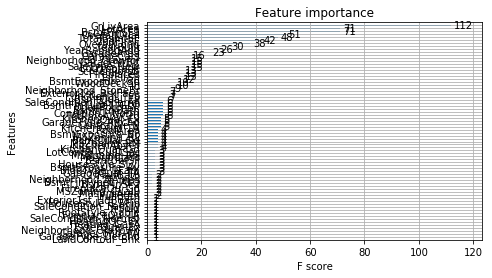

In [25]:
#I think there will be a positive relationship with year built, with newer homes being more expensive.
#I also think that the lot area will have a positive relationship- more space means more expensive.
#Finally, I think that lot frontage will have less of a strong relationship than the other two factors I investigate

#plots = plot_partial_dependency(model, features=[2, 3, 6], 
from xgboost import plot_importance
plot_importance(model)
#xgb.plot.importance(model)

In [26]:
import shap

shap.initjs()

explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

In [27]:
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:])


In [28]:
#visualizes all of the training set predictions
shap.force_plot(explainer.expected_value, shap_values, X)


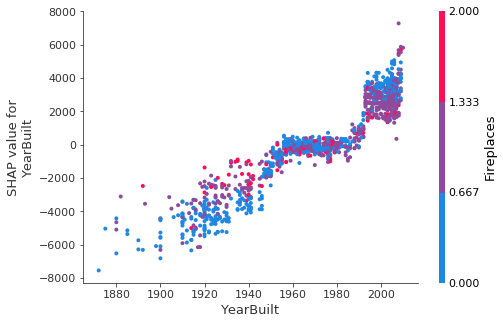

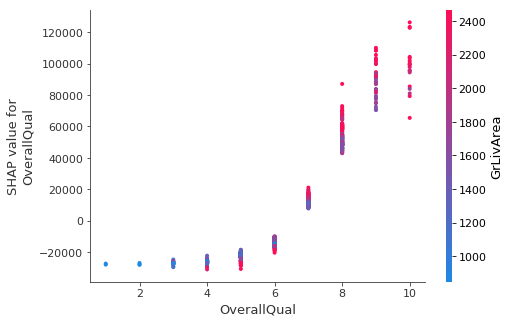

In [32]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("YearBuilt", shap_values, X)
shap.dependence_plot("OverallQual", shap_values, X)


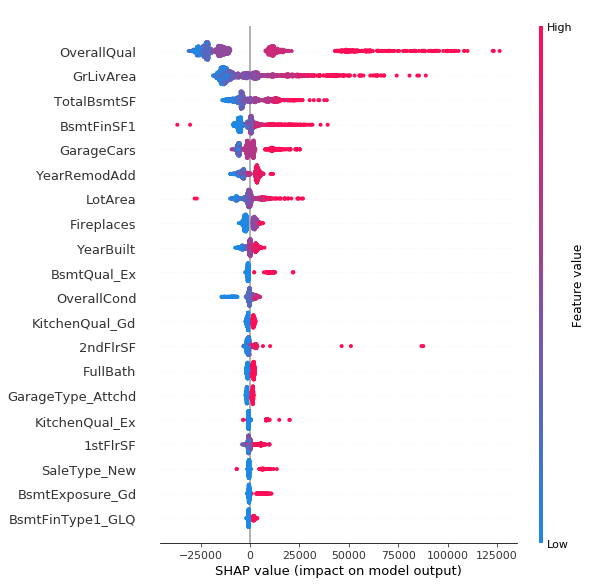

In [30]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X)

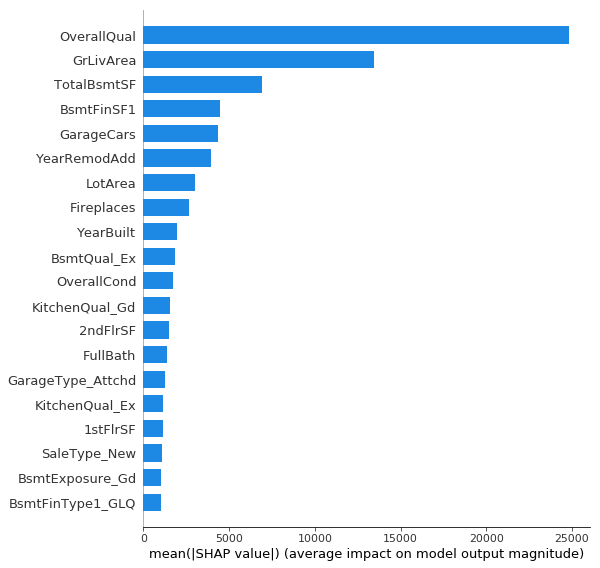

In [31]:
shap.summary_plot(shap_values, X, plot_type="bar")